In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
%config InlineBackend.figure_format = 'retina'

In [4]:
import sys
sys.path.append('../src')

In [5]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import pandas as pd
from spaceoracle.models.parallel_estimators import SpatialCellularProgramsEstimator


In [8]:
import sys
sys.path.append('/Users/koush/Projects/sctools')
sys.path.append('/Users/koush/Projects/platter')

from sctools import sctools as sct
from sctools import utils as sctu
from platter import plat

In [6]:
adata_train = sc.read_h5ad('.cache/adata_train.h5ad')
adata_train

AnnData object with n_obs × n_vars = 11567 × 5013
    obs: 'cluster', 'rctd_cluster', 'rctd_celltypes'
    uns: 'log1p'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [37]:
estimator_Il2 = SpatialCellularProgramsEstimator(
    adata=adata_train,
    target_gene='Il2',
)

estimator_Il2ra = SpatialCellularProgramsEstimator(
    adata=adata_train,
    target_gene='Il2ra',
)

estimator_Pax5 = SpatialCellularProgramsEstimator(
    adata=adata_train,
    target_gene='Pax5',
)

In [38]:
%%time

estimator_Il2.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
estimator_Il2ra.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
estimator_Pax5.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)

Fitting Il2 with 45 modulators
	5 Transcription Factors
	24 Ligand-Receptor Pairs
	16 TranscriptionFactor-Ligand Pairs
0: 0.2074 | 0.1090
1: 0.5099 | 0.3197
2: 0.4620 | 0.2544
3: 0.7670 | 0.3174
4: 0.7117 | 0.3977
5: 0.8214 | 0.3802
6: 0.8979 | 0.3398


Fitting Il2ra with 93 modulators
	18 Transcription Factors
	26 Ligand-Receptor Pairs
	49 TranscriptionFactor-Ligand Pairs
0: 0.9205 | 0.9113
1: 0.5673 | 0.5172
2: 0.5832 | 0.5317
3: 0.6997 | 0.6186
4: 0.7956 | 0.7590
5: 0.7994 | 0.5982
6: 0.7816 | 0.6306


Fitting Pax5 with 228 modulators
	59 Transcription Factors
	27 Ligand-Receptor Pairs
	142 TranscriptionFactor-Ligand Pairs
0: 0.9559 | 0.9522
1: 0.9627 | 0.9463
2: 0.9559 | 0.9352
3: 0.9550 | 0.9355
4: 0.9803 | 0.9787
5: 0.9811 | 0.9717
6: 0.9890 | 0.9835
CPU times: user 12min 1s, sys: 2min 33s, total: 14min 34s
Wall time: 56min 47s


In [133]:
estimator_Il2.betadata.to_parquet(f'./models/{estimator_Il2.target_gene}_betadata.parquet')
estimator_Il2ra.betadata.to_parquet(f'./models/{estimator_Il2ra.target_gene}_betadata.parquet')
estimator_Pax5.betadata.to_parquet(f'./models/{estimator_Pax5.target_gene}_betadata.parquet')

In [30]:
# plt.rcParams['figure.figsize'] = (25, 3)
# plt.rcParams['figure.dpi'] = 120

# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '#' not in i and '$' not in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )
# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()

# plt.rcParams['figure.figsize'] = (25, 5)
# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '$' in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )
# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()
# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '#' in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )

# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()

In [31]:
# y_pred = CellularNicheNetwork.predict_y(inputs_x, betas)

# r2_score(
#     estimator.train_df[estimator.target_gene], 
#     y_pred.cpu().numpy()
# )

In [32]:
cmaps = dict(zip(range(7), ['rainbow', 'hot', 'cool_r', 'spring', 'viridis', 'PuRd', 'Reds']))


,beta_Igf1$Itga6,beta_Cxcl12$Cxcr4,beta_Cxcl13$Cxcr5,beta_Il4$Il4ra,beta_Il4$Il2rg,beta_Il7$Il7r,beta_Il7$Il2rg,beta_Il15$Il2rb,beta_Il15$Il2rg,beta_Il21$Il21r,...,beta_Ebi3#Mga,beta_Il21#Mga,beta_Clcf1#Mga,beta_Csf1#Msc,beta_Lif#Msc,beta_Il15#Msc,beta_Il4#Msc,beta_Ebi3#Prdm9,beta_Il21#Prdm9,beta_Osm#Prdm9
AAAAAACGGTAGAT,0.128315,-0.119534,-0.318235,-0.000000,-0.000000,0.000000,-0.000000,-0.111435,0.0,-0.000000,...,-0.046373,-0.000000,0.010848,-0.000000,-0.000000,-0.020197,-0.010369,0.000000,-0.0,-0.076778
AAAAAATCCGGCGA,0.000000,-0.306407,-0.101202,-0.327712,0.088776,0.200572,-0.187523,-0.145335,0.0,0.000000,...,-0.000000,-0.000000,-0.063965,0.000000,0.115804,0.000000,0.261959,0.177962,0.0,-0.000000
AAAAACCGTCAGAC,0.231826,-0.087956,-0.109482,-0.000000,-0.000000,0.000000,-0.000000,-0.114657,0.0,0.000000,...,-0.004238,0.000000,-0.017053,0.000000,-0.000000,0.034996,0.072308,0.000000,-0.0,-0.036156
AAAAACGCTCCGAC,0.202223,-0.128957,-0.182713,-0.000000,-0.000000,0.000000,-0.000000,-0.148678,0.0,-0.000000,...,-0.015906,-0.000000,-0.014732,-0.000000,-0.000000,0.021755,0.061199,0.000000,-0.0,-0.048092
AAAAAGCACGTGTT,0.145834,-0.084068,-0.180754,-0.000000,-0.000000,0.000000,-0.000000,-0.088062,0.0,0.000000,...,-0.016570,-0.000000,-0.014176,-0.000000,-0.000000,0.000654,0.023412,-0.000000,-0.0,-0.051624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTCGCGGCTA,-0.000000,-0.432214,-0.145085,-0.646649,0.088309,0.149929,-0.372076,-0.169286,0.0,-0.000000,...,-0.000000,-0.000000,-0.094685,0.000000,0.150378,0.000000,0.420856,0.305604,0.0,-0.000000
TTTTTTGGGCTGGT,0.146751,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.119000,0.0,-0.181411,...,0.053849,-0.078664,0.000000,-0.093163,0.000000,0.000000,0.000000,-0.000000,0.0,-0.000000
TTTTTTGTACCCAC,0.187960,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.021225,0.0,-0.183752,...,0.043294,-0.043302,0.000000,-0.063072,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
TTTTTTGTACGATT,0.134837,-0.180003,-0.458171,0.000000,-0.000000,0.000000,-0.000000,-0.133588,0.0,-0.000000,...,-0.057023,-0.000000,0.003869,-0.000000,-0.000000,0.016860,0.021754,0.000000,-0.0,-0.045367


In [172]:
from spaceoracle.oracles import SpaceOracle
from spaceoracle.tools.utils import min_max_df

estimator = estimator_Pax5

so = SpaceOracle(adata=adata_train, save_dir = './models')
beta_dict = {estimator.target_gene: so._get_betas(estimator.target_gene)}

gex_df = min_max_df(estimator.adata.to_df(layer=estimator.layer))
beta_dict = so._get_wbetas_dict(beta_dict, gex_df)
wbetas = beta_dict[estimator.target_gene].wbetas[1]
wbetas = wbetas.join(
    beta_dict[estimator.target_gene].betas[
        ['beta_'+i for i in list(estimator.lr_pairs)+list(estimator.tfl_pairs)]]
)

# reformat betas so it's the same as when plot method was written
xy = pd.DataFrame(
    adata_train.obsm['spatial'], index=adata_train.obs.index, columns=['x', 'y'])

df = wbetas \
        .join(adata_train.obs) \
        .join(xy) \
        .join(gex_df)

df

Ligand interactions: 100%|██████████| 1/1 [00:00<00:00, 11.81it/s]


,beta_Angptl2,beta_Angptl4,beta_Atf3,beta_Bcl11a,beta_Bcl11b,beta_Bclaf1,beta_Brca1,beta_Brf1,beta_C3,beta_C4b,...,Zswim1,Zswim3,Zswim4,Zswim6,Zswim9,Zup1,Zw10,Zwilch,Zxdc,Zzef1
AAAAAACGGTAGAT,0.0,0.0,-0.014149,0.141346,-0.092216,0.022622,-0.010790,0.003202,0.004510,0.008441,...,0.097589,0.421042,0.176841,0.131493,0.000000,0.472964,0.564513,0.679694,0.512763,0.475320
AAAAAATCCGGCGA,0.0,0.0,-0.007717,0.150295,-0.050654,0.013441,-0.000012,-0.016410,0.000600,0.000534,...,0.000000,0.389565,0.188951,0.196777,0.232299,0.551113,0.397646,0.633051,0.673578,0.476067
AAAAACCGTCAGAC,0.0,0.0,-0.009507,0.185502,-0.103462,0.014459,-0.014433,0.006599,0.014272,0.029974,...,0.493399,0.274746,0.176841,0.586356,0.397738,0.223781,0.277076,0.389925,0.227259,0.549043
AAAAACGCTCCGAC,0.0,0.0,-0.008736,0.184093,-0.102725,0.015608,-0.013977,0.007044,0.009290,0.019536,...,0.493399,0.274746,0.188951,0.314296,0.177184,0.310542,0.415657,0.272793,0.520555,0.438414
AAAAAGCACGTGTT,0.0,0.0,-0.009508,0.162607,-0.105261,0.018551,-0.010639,0.005332,0.009085,0.018761,...,0.682703,0.274746,0.000000,0.313466,0.177184,0.268726,0.641424,0.583910,0.432878,0.547513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTCGCGGCTA,0.0,0.0,-0.006624,0.129404,-0.040327,0.011607,-0.000008,-0.011679,0.005039,0.004581,...,0.259127,0.274746,0.000000,0.179997,0.000000,0.399256,0.361111,0.565977,0.678025,0.336376
TTTTTTGGGCTGGT,0.0,0.0,-0.020590,0.065921,-0.033310,0.000021,0.000007,-0.016485,0.003058,0.002676,...,0.000000,0.389565,0.365792,0.280179,0.191453,0.429524,0.326576,0.633051,0.516638,0.728582
TTTTTTGTACCCAC,0.0,0.0,-0.019761,0.093861,-0.026527,0.000022,0.000003,-0.010853,0.003793,0.003818,...,0.121475,0.274746,0.176841,0.206385,0.000000,0.579687,0.561819,0.614170,0.439503,0.631251
TTTTTTGTACGATT,0.0,0.0,0.000951,0.160332,-0.058151,0.014290,0.000974,0.001877,0.006559,0.010172,...,0.120031,0.274746,0.000000,0.178278,0.165439,0.262309,0.260203,0.556804,0.442145,0.538908


In [150]:
markers = ['o', 'X', '<', '^', 'v', 'D', '>']
cmaps = dict(zip(range(7), ['rainbow', 'cool', 'RdYlGn_r', 'spring_r', '', 'PuRd', 'Reds']))
cell_map = dict(zip(df['rctd_cluster'], df['rctd_celltypes']))

def plot(plot_for, clusters=[0, 1, 2], with_expr=False, size=25, linewidth=0.5, alpha=1, edgecolor='black', dpi=100, figsize=(11, 9), fig=None, axes=None):

    if fig is None or axes is None:
        fig, (ax, cax) = plt.subplots(1, 2, dpi=dpi, figsize=figsize, gridspec_kw={'width_ratios': [4, 0.5]})
    else:
        ax, cax = axes

    # Get cluster-specific min/max for individual colorbar scales
    norms = {}
    for i in clusters:
        cluster_data = df[df.rctd_cluster==i][plot_for]
        vmin = cluster_data.min()
        vmax = cluster_data.max()
        norms[i] = plt.Normalize(vmin=vmin, vmax=vmax)

    for i in clusters:
        betas_df = df[df.rctd_cluster==i]
        missing_columns = list(set(estimator.train_df.columns) - set(betas_df.columns))
        betas_df = betas_df.join(estimator.train_df[missing_columns])

        if with_expr:
            betas_df[plot_for] = betas_df[plot_for]*betas_df[plot_for.replace('beta_', '')]

        sns.scatterplot(
            data=betas_df,
            x='x', 
            y='y',
            hue=plot_for,
            palette=cmaps[i],
            s=size,
            alpha=alpha,
            # alpha= 1 if i == 2 else 0.25,
            linewidth=linewidth,
            edgecolor=edgecolor,
            legend=False,
            style='rctd_celltypes',
            markers=markers,
            ax=ax
        )
    ax.axis('off')

    cbar_width = 0.15  # Width of each colorbar
    cbar_height = 0.8 / len(cmaps)  # Height of each colorbar
    for i, cmap_name in cmaps.items():
        if i not in [0, 1, 2]:
            continue
        cmap = plt.get_cmap(cmap_name)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norms[i])
        sm.set_array([])
        cax_i = cax.inset_axes([0.2, 0.95 - (i+1)*cbar_height*2.5, cbar_width, cbar_height*1.5])
        cbar = fig.colorbar(sm, cax=cax_i, orientation='vertical')
        cbar.ax.tick_params(labelsize=9)  # Reduce tick label size
        cbar.ax.set_title(f'{cell_map[i]}', fontsize=12, pad=8)  # Reduce title size and padding

    cax.set_ylabel(plot_for, fontsize=8)
    cax.axis('off')

    unique_styles = sorted(set(df['rctd_celltypes']))
    style_handles = [plt.Line2D([0], [0], marker=m, color='w', markerfacecolor='gray', 
                    markersize=10, linestyle='None', alpha=1) 
                    for m in markers][:len(unique_styles)]
    ax.legend(style_handles, unique_styles, ncol=1,
        title='Cell types', loc='lower left',  
        frameon=False)

    ax.set_title(f'{plot_for} > {estimator.target_gene}', fontsize=15)
    
    return ax

In [164]:
import commot as ct
df_ligrec = ct.pp.ligand_receptor_database(
        database='CellChat', 
        species='mouse', 
        signaling_type="Secreted Signaling"
    )
    
df_ligrec.columns = ['ligand', 'receptor', 'pathway', 'signaling']  

In [167]:
df_ligrec[df_ligrec['receptor'].str.contains('Il2ra')]


,ligand,receptor,pathway,signaling
719,Il2,Il2ra_Il2rb_Il2rg,IL2,Secreted Signaling


In [160]:
estimator.lr_pairs

604            Igf1$Itga6
700          Cxcl12$Cxcr4
702          Cxcl13$Cxcr5
719             Il2$Il2rb
719             Il2$Il2rg
721             Il4$Il4ra
721             Il4$Il2rg
722              Il7$Il7r
722             Il7$Il2rg
724            Il15$Il2rb
724            Il15$Il2rg
725            Il21$Il21r
725            Il21$Il2rg
742           Ebi3$Il27ra
742            Ebi3$Il6st
745           Clcf1$Il6st
747             Lif$Il6st
748             Osm$Il6st
773            Csf1$Csf1r
827    Tnfsf13b$Tnfrsf13c
849          Angptl2$Pirb
859          Angptl4$Sdc4
877              Ptn$Sdc4
879               Ptn$Ncl
892                C3$Cr2
896               C4b$Cr2
Name: pairs, dtype: object

<Axes: title={'center': 'beta_Ebi3$Il27ra > Pax5'}, xlabel='x', ylabel='y'>

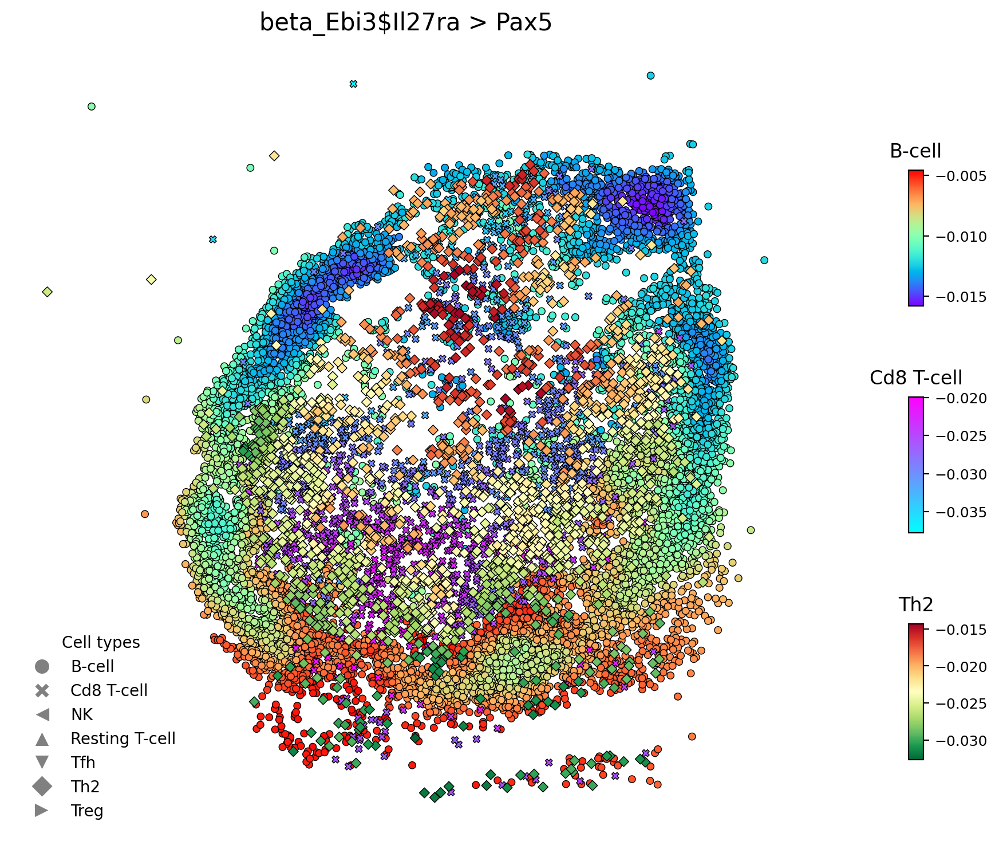

In [180]:
plot('beta_Ebi3$Il27ra', dpi=100, size=20)

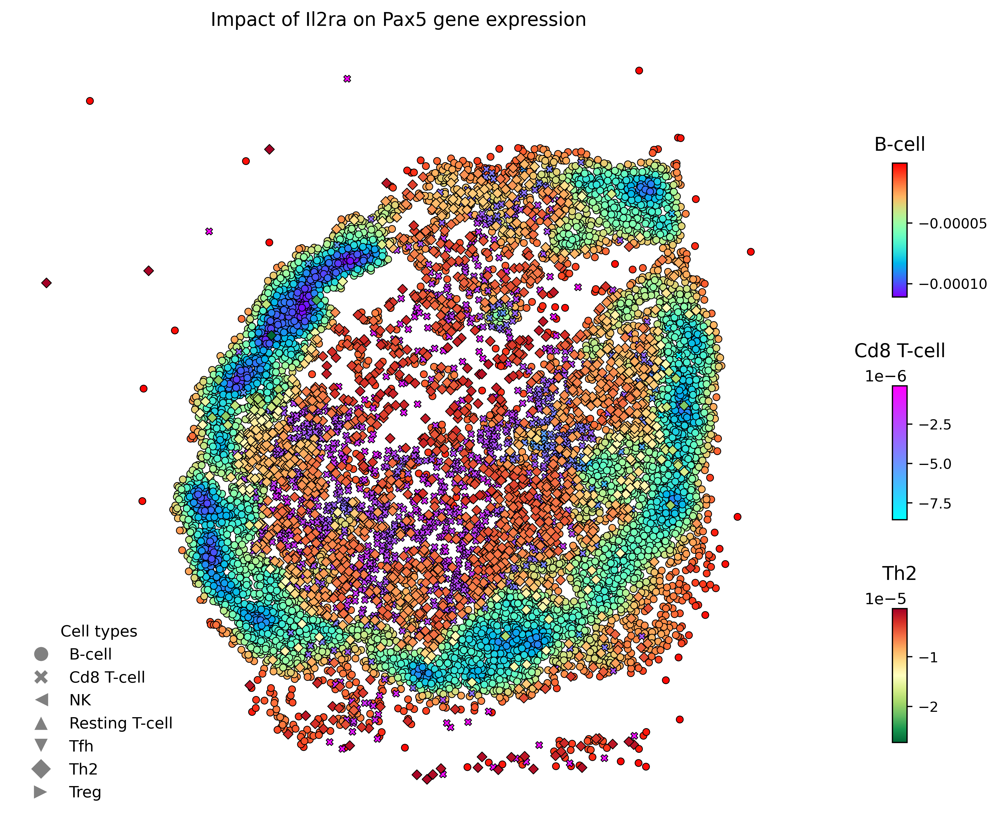

In [148]:
ax = plot('beta_Il2ra', dpi=200, size=20)
ax.set_title('Impact of Il2ra on Pax5 gene expression')
# plt.savefig('/tmp/img.svg', dpi=200, transparent=True, format='svg')
plt.show()

ValueError: Could not interpret value `beta_Il2#Egr2` for `hue`. An entry with this name does not appear in `data`.

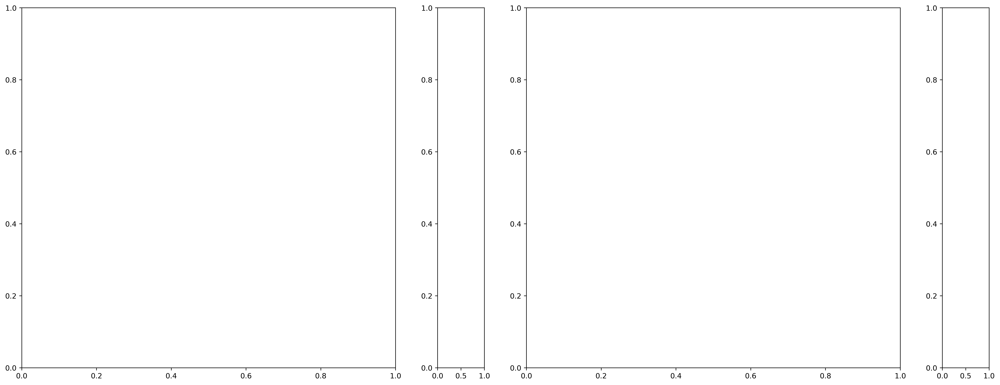

In [70]:
fig, axs = plt.subplots(1, 4, dpi=180, figsize=(12*2, 9*1), gridspec_kw={'width_ratios': [4, 0.5]*2})
axs = axs.flatten()
axs = [(axs[i], axs[i+1]) for i in range(0, len(axs), 2)]
plot('beta_Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[0])
plot('beta_Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[1], with_expr=True)
# plot('Egr2', dpi=100, size=20, fig=fig, axes=axs[2])
# plot('Il2', dpi=100, size=20, fig=fig, axes=axs[3])
# plot('beta_Egr2', dpi=100, size=20, fig=fig, axes=axs[4])
# plot('Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[5])
plt.show()


In [19]:
# Create toy example matrices
import numpy as np

# Small example matrices
n_cells = 5
n_genes = 3

# Create random gene expression matrix (cells x genes)
X = np.random.rand(n_cells, n_genes)
print("Gene expression matrix (cells x genes):")
print("\nShape:", X.shape)

# Create random beta coefficients matrix (genes x cells x cells)
beta = np.random.rand(n_cells, n_genes, n_genes)
print("\nBeta coefficients matrix (genes x cells x cells):")
print("\nShape:", beta.shape)


Gene expression matrix (cells x genes):

Shape: (5, 3)

Beta coefficients matrix (genes x cells x cells):

Shape: (5, 3, 3)


In [17]:
import torch

In [53]:
# Create random tensors with PyTorch
X = torch.rand(100, 5000)
beta = torch.rand(100, 5000, 5000)

In [54]:
%%time

_ = torch.bmm(X.unsqueeze(1), beta).squeeze().numpy()

CPU times: user 723 ms, sys: 2.09 s, total: 2.81 s
Wall time: 2.82 s


In [49]:
np.array([X[i].dot(beta[i]) for i in range(n_cells)])

array([[0.13702772, 0.19225841, 0.24748909],
       [0.27830628, 0.34993997, 0.42157367],
       [0.64076799, 0.74032077, 0.83987354],
       [0.28644404, 0.32738886, 0.36833368],
       [1.20536068, 1.32947421, 1.45358774]])

In [26]:
X[0].shape, beta[0].shape

((3,), (3, 3))

In [10]:
beta[0].shape

(5,)

In [12]:
X[0].dot(beta[0])

ValueError: shapes (3,) and (5,) not aligned: 3 (dim 0) != 5 (dim 0)

In [93]:
adata = sc.read_h5ad('/Users/koush/Projects/SpaceOracle/data/slideseq/day3_1.h5ad')

In [94]:
adata

AnnData object with n_obs × n_vars = 15920 × 24649
    obs: 'cluster', 'rctd_cluster'
    uns: 'cluster_colors', 'rctd_cluster_colors'
    obsm: 'X_spatial', 'rctd_results', 'spatial'

In [98]:
import json
with open('/Users/koush/Projects/SpaceOracle/data/celltype_assign.json', 'r') as f:
    cell_type_mapping = json.load(f)
adata.obs['rctd_celltypes'] = adata.obs['rctd_cluster'].astype(str).map(cell_type_mapping)

In [102]:
markers = ['o', 'X', '<', '^', 'v', 'D', '>']
cmaps = dict(zip(range(7), ['rainbow', 'cool', 'RdYlGn_r', 'spring_r', '', 'PuRd', 'Reds']))

In [109]:
data = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs.index).join(adata.obs)

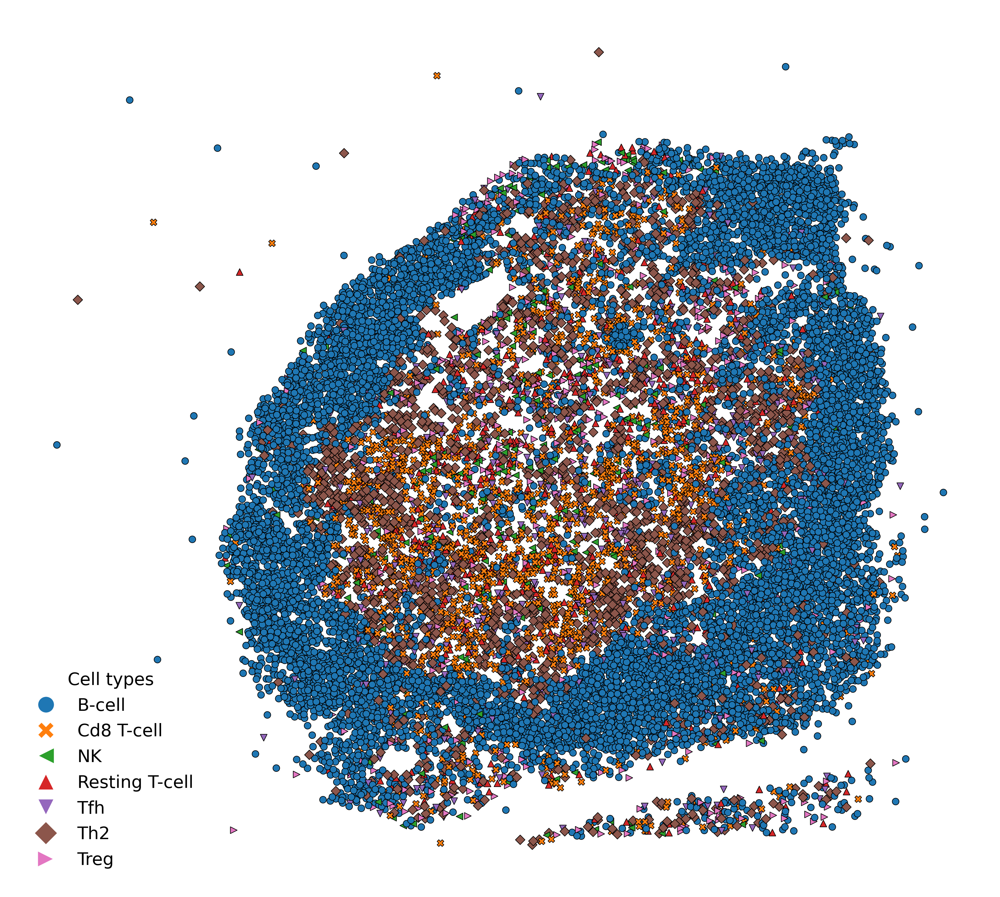

In [131]:
fig, ax = plt.subplots(1, dpi=200, figsize=(10, 9))

scatter = sns.scatterplot(
    data=data,
    x='x', 
    y='y',
    s=15,
    alpha=1,
    linewidth=0.35,
    edgecolor='black',
    legend=False,
    style='rctd_celltypes',
    hue='rctd_celltypes',
    markers=markers,
    ax=ax
)
ax.set_frame_on(False)
unique_styles = sorted(set(data['rctd_celltypes']))
palette = sns.color_palette(n_colors=len(unique_styles))
style_handles = [plt.Line2D([0], [0], marker=m, color='w', markerfacecolor=palette[i], 
                markersize=10, linestyle='None', alpha=1) 
                for i, m in enumerate(markers)][:len(unique_styles)]
ax.legend(style_handles, unique_styles, ncol=1,
title='Cell types', loc='lower left',  
frameon=False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
plt.savefig('/tmp/lymph.png', dpi=200, transparent=True)
plt.show()